<a href="https://colab.research.google.com/github/catastropiyush/exmol/blob/main/exmol.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install exmol

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 47.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.3/34.3 MB 67.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 100.4 MB/s eta 0:00:00
  Created wheel for ratelimit: filename=ratelimit-2.2.1-py3-none-any.whl size=5895 sha256=99793e96e430136a89f21ffbbe3b6eb4397acf7635e60640312bdc67f4cbd7cc
  Stored in directory: /root/.cache/pip/wheels/ee/d5/e5/8fbffe089140fb498987b7709becf861086daace105d243475
Successfully built ratelimit


In [4]:
!pip install mordred

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.8/128.8 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 33.8 MB/s eta 0:00:00
  Created wheel for mordred: filename=mordred-1.2.0-py3-none-any.whl size=176718 sha256=af9e803664325d2c32e601eb2737f9e0faab4acfa243f79d956f0d2983b93877
  Stored in directory: /root/.cache/pip/wheels/8b/30/0b/84e3f6775306e74cf5957ee4d16b10bf3927dcec44cc23d5f2
Successfully built mordred
  Attempting uninstall: networkx
    Found existing installation: networkx 3.4.2
    Uninstalling networkx-3.4.2:
      Successfully uninstalled networkx-3.4.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scikit-image 0.25.2 requires networkx>=3.0, but you have networkx 2.8.8 which is incompatible.
nx-cugraph-cu12 25.2.0 requires networkx>=3.2, but you have networkx 2.8.8 which is

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import rdkit, rdkit.Chem, rdkit.Chem.Draw
from rdkit.Chem.Draw import IPythonConsole
import numpy as np
import mordred, mordred.descriptors
import exmol
from rdkit.Chem.Draw import rdDepictor

# rdDepictor.SetPreferCoordGen(True)

IPythonConsole.ipython_useSVG = True
sns.set_context("notebook")
sns.set_style(
    "dark",
    {
        "xtick.bottom": True,
        "ytick.left": True,
        "xtick.color": "#666666",
        "ytick.color": "#666666",
        "axes.edgecolor": "#666666",
        "axes.linewidth": 0.8,
        "figure.dpi": 300,
    },
)
color_cycle = ["#1BBC9B", "#F06060", "#F3B562", "#6e5687", "#5C4B51"]
mpl.rcParams["axes.prop_cycle"] = mpl.cycler(color=color_cycle)

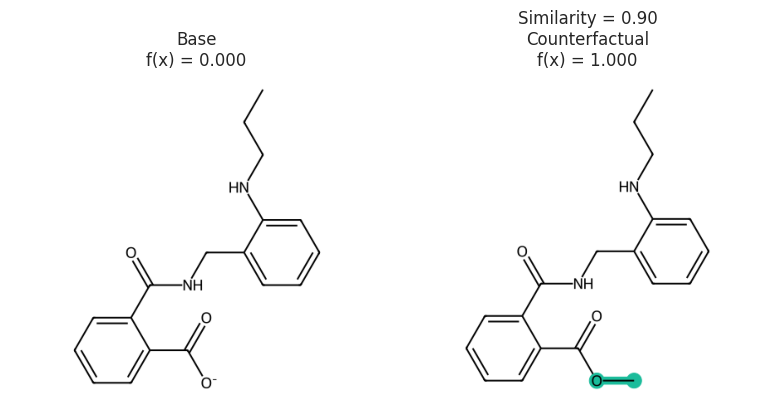

In [6]:
s1 = "O=C([O-])C1=CC=CC=C1C(=O)NCC2=CC=CC=C2NCCC"
s2 = "O=C(OC)C1=CC=CC=C1C(=O)NCC2=CC=CC=C2NCCC"
e1 = exmol.Example(s1, "", 0, 0, 0, is_origin=True)
e2 = exmol.Example(s2, "", 0.9, 1.0, 1.0, label="Counterfactual")
fkw = {"figsize": (8, 6)}
font = {"family": "normal", "weight": "normal", "size": 22}

mpl.rc("axes", titlesize=12)
exmol.plot_cf([e1, e2], figure_kwargs=fkw, mol_size=(450, 400), nrows=1)
plt.tight_layout()
svg = exmol.insert_svg([e1, e2])
with open("counterfactual.svg", "w") as f:
    f.write(svg)

In [7]:
from rdkit import Chem
from rdkit.Chem.Draw import IPythonConsole

# set-up rdkit drawing preferences
IPythonConsole.ipython_useSVG = True
IPythonConsole.drawOptions.drawMolsSameScale = False


def model(smiles):
    mol = Chem.MolFromSmiles(smiles)
    match = mol.GetSubstructMatches(Chem.MolFromSmarts("[O;!H0]"))
    return 1 if match else 0

f(s) 1


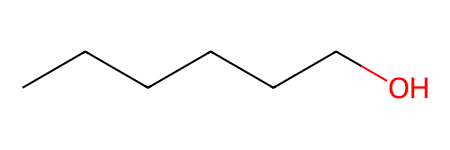

In [8]:
smi = "CCCCCCO"
print("f(s)", model(smi))
Chem.MolFromSmiles(smi)

f(s) 1


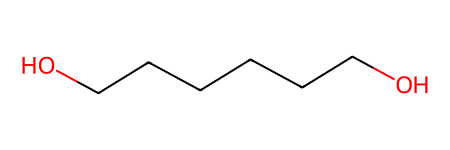

In [9]:
smi = "OCCCCCCO"
print("f(s)", model(smi))
Chem.MolFromSmiles(smi)

f(s) 0


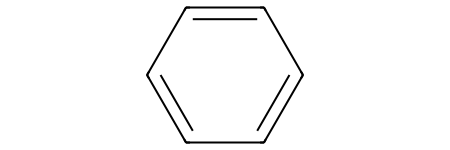

In [10]:
smi = "c1ccccc1"
print("f(s)", model(smi))
Chem.MolFromSmiles(smi)

In [11]:
import exmol

instance = "CCCCCCO"
space = exmol.sample_space(instance, model, batched=False)

🤘Done🤘: 100%|██████████| 614.0/614 [00:00<00:00, 3226.07it/s]


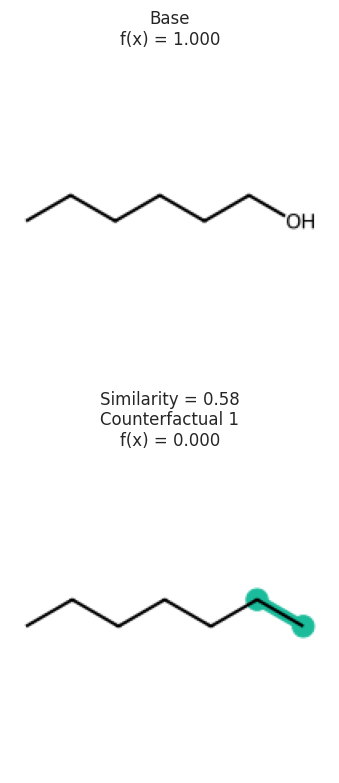

In [12]:
cfs = exmol.cf_explain(space, 1)
exmol.plot_cf(cfs)

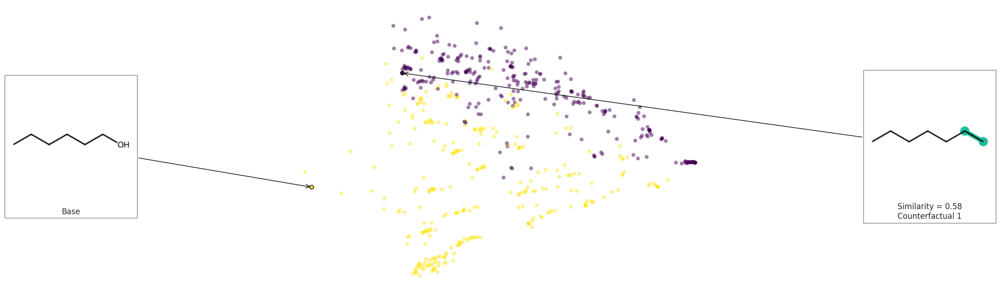

In [13]:
exmol.plot_space(space, cfs)

SMARTS annotations for MACCS descriptors were created using SMARTSviewer (smartsview.zbh.uni-hamburg.de, Copyright: ZBH, Center for Bioinformatics Hamburg) developed by K. Schomburg et. al. (J. Chem. Inf. Model. 2010, 50, 9, 1529–1535)


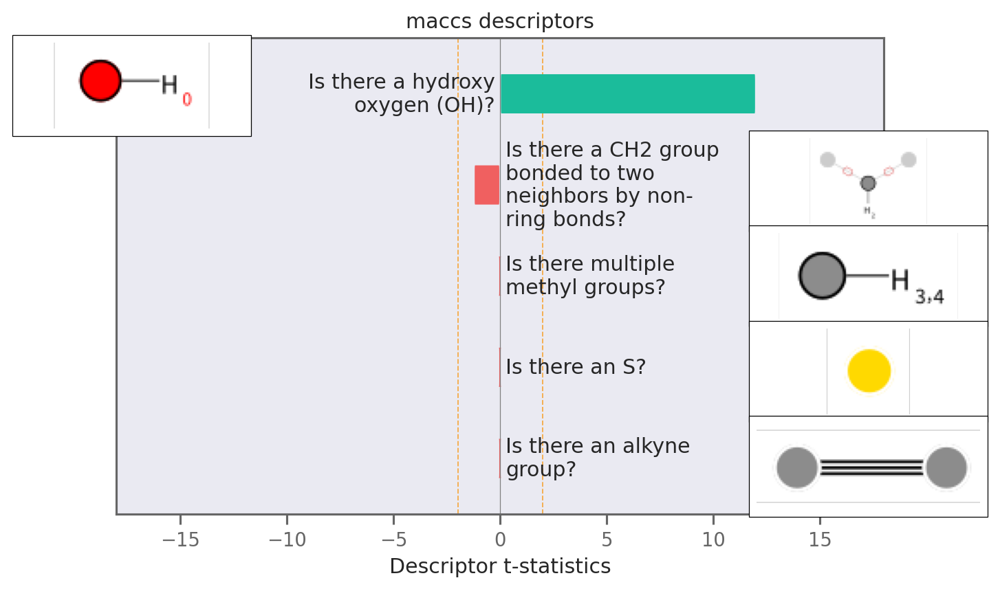

In [14]:
exmol.lime_explain(space)
exmol.plot_descriptors(space)

In [15]:
import skunk

exmol.lime_explain(space, descriptor_type="ECFP")
svg = exmol.plot_descriptors(space, return_svg=True)
skunk.display(svg)
svg = exmol.plot_utils.similarity_map_using_tstats(space[0], return_svg=True)
skunk.display(svg)

In [16]:
exmol.lime_explain(space, descriptor_type="ECFP")
e = exmol.text_explain(space)
for ei in e:
    print(ei[0], end="")

Is there primary alcohol? Yes and this is positively correlated with property. This is very important for the property


# **MMACE Paper: Random Forest for Blood-Brain Barrier**

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import rdkit, rdkit.Chem, rdkit.Chem.Draw
from rdkit.Chem.Draw import IPythonConsole
import numpy as np
import skunk
import mordred, mordred.descriptors
import exmol as exmol
from rdkit.Chem.Draw import rdDepictor
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, plot_roc_curve

ImportError: cannot import name 'plot_roc_curve' from 'sklearn.metrics' (/usr/local/lib/python3.11/dist-packages/sklearn/metrics/__init__.py)

In [19]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, RocCurveDisplay # Instead of plot_roc_curve, import RocCurveDisplay

In [20]:
data = pd.read_csv("BBBP.csv")
data.head()

,num,name,p_np,smiles
0,1,Propanolol,1,[Cl].CC(C)NCC(O)COc1cccc2ccccc12
1,2,Terbutylchlorambucil,1,C(=O)(OC(C)(C)C)CCCc1ccc(cc1)N(CCCl)CCCl
2,3,40730,1,c12c3c(N4CCN(C)CC4)c(F)cc1c(c(C(O)=O)cn2C(C)CO...
3,4,24,1,C1CCN(CC1)Cc1cccc(c1)OCCCNC(=O)C
4,5,cloxacillin,1,Cc1onc(c2ccccc2Cl)c1C(=O)N[C@H]3[C@H]4SC(C)(C)...


In [21]:
# make object that can compute descriptors
calc = mordred.Calculator(mordred.descriptors, ignore_3D=True)
# make subsample from pandas df
molecules = [rdkit.Chem.MolFromSmiles(smi) for smi in data.smiles]

# the invalid molecules were None, so we'll just
# use the fact the None is False in Python
valid_mol_idx = [bool(m) for m in molecules]
valid_mols = [m for m in molecules if m]
try:
    raw_features = pd.read_pickle("raw_features.pb")
except FileNotFoundError as e:
    raw_features = calc.pandas(valid_mols, nproc=8, quiet=True)
    raw_features.to_pickle("raw_features.pb")

/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  r

In [22]:
labels = data[valid_mol_idx].p_np

In [24]:
fm = raw_features.select_dtypes(include=np.number).mean() # Calculate mean only for numeric columns
fs = raw_features.select_dtypes(include=np.number).std()  # Calculate std
def feature_convert(f):
    f -= fm
    f /= fs
    return f


features = feature_convert(raw_features)

# we have some nans in features, likely because std was 0
features = features.values.astype(float)
features_select = np.all(np.isfinite(features), axis=0)
features = features[:, features_select]

AUC 0.9039481000926785


<Figure size 1200x900 with 0 Axes>

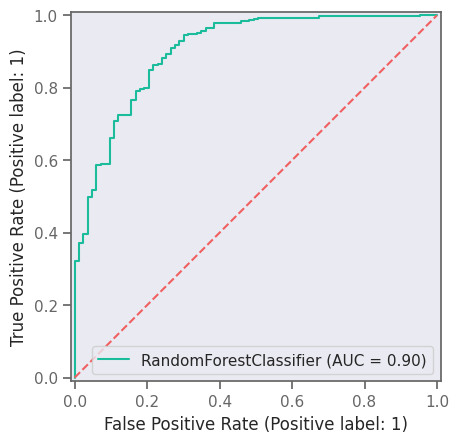

In [26]:
X_train, X_test, y_train, y_test = train_test_split(
    features, labels, test_size=0.2, shuffle=True
)

clf = RandomForestClassifier(max_depth=8, random_state=0)
clf.fit(X_train, y_train)
predicted = clf.predict(X_test)
print("AUC", roc_auc_score(y_test, clf.predict_proba(X_test)[:, 1]))
plt.figure(figsize=(4, 3), dpi=300)
RocCurveDisplay.from_estimator(clf, X_test, y_test) # This will plot the ROC curve
plt.plot([0, 1], [0, 1], linestyle="--")
plt.savefig("RF-ROC.png")

In [27]:
def model_eval(smiles, _=None):
    molecules = [rdkit.Chem.MolFromSmiles(smi) for smi in smiles]
    # input wrangling. Get some weird values from weird smiles
    raw_features = calc.pandas(molecules, nproc=8, quiet=True)
    features = feature_convert(raw_features)
    features = features.values.astype(float)
    features = features[:, features_select]
    labels = clf.predict(np.nan_to_num(features))
    return labels
    # return np.random.choice([True, False], size=labels.shape)


labels = model_eval(data.iloc[valid_mol_idx].smiles.values[:100])

In [28]:
example_neg = data.iloc[valid_mol_idx].smiles.values[np.argmin(labels)]
example_pos = data.iloc[valid_mol_idx].smiles.values[np.argmax(labels)]
example_neg_y, example_pos_y = model_eval([example_neg, example_pos])
print("neg:", example_neg, "\npos:", example_pos)
print(example_neg_y, example_pos_y)

neg: Cc1onc(c2ccccc2Cl)c1C(=O)N[C@H]3[C@H]4SC(C)(C)[C@@H](N4C3=O)C(O)=O 
pos: [Cl].CC(C)NCC(O)COc1cccc2ccccc12
0 1


In [29]:
space = exmol.sample_space(example_neg, model_eval, quiet=True)


In [30]:
exps = exmol.cf_explain(space)
print(exps)

[Example(smiles='CC1=C(C(=O)N[C@H]2[C@H]3SC(C)(C)[C@H](C(O)=O)N3C2=O)C(C2=CC=CC=C2Cl)=NO1', selfies='[C][C][=C][Branch2][Ring1][#C][C][=Branch1][C][=O][N][C@H1][C@H1][S][C][Branch1][C][C][Branch1][C][C][C@H1][Branch1][=Branch1][C][Branch1][C][O][=O][N][Ring1][#Branch2][C][Ring1][N][=O][C][Branch1][#Branch2][C][=C][C][=C][C][=C][Ring1][=Branch1][Cl][=N][O][Ring2][Ring1][N]', similarity=1.0, yhat=0, index=0, position=array([-10.03857689,  -2.08416906]), is_origin=True, cluster=-1, label=None, descriptors=None), Example(smiles='C1(C)(C)[C@H](Br)N2[C@@H]([C@H](NC(=O)C3=C(C)ON=C3C3=CC=CC=C3Cl)C2=O)S1', selfies='[C][Branch1][C][C][Branch2][Branch1][C][C@@H1][Branch2][Ring2][=Branch2][N][C@@H1][Branch2][Ring1][S][C@@H1][Branch1][Branch1][C][Ring1][Ring2][=O][N][C][=Branch1][C][=O][C][C][=Branch1][#Branch1][=N][O][C][=Ring1][Branch1][C][C][=C][C][=C][C][=C][Ring1][=Branch1][Cl][S][Ring2][Ring1][=Branch2][Br][=Branch1][C][=O][O][C]', similarity=0.8, yhat=1, index=77, position=array([-8.07311768

FileNotFoundError: [Errno 2] No such file or directory: 'svg_figs/rf-simple.svg'

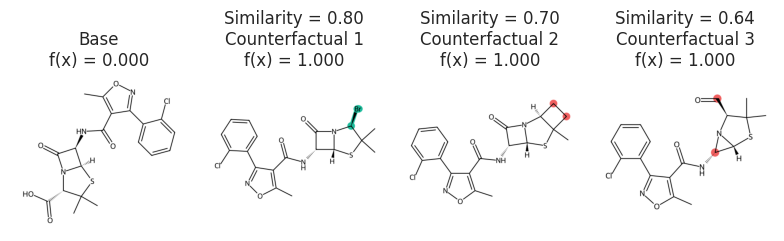

In [31]:
fkw = {"figsize": (8, 6)}
mpl.rc("axes", titlesize=12)
exmol.plot_cf(exps, figure_kwargs=fkw, mol_size=(450, 400), nrows=1)

plt.savefig("rf-simple.png", dpi=180)
svg = exmol.insert_svg(exps, mol_fontsize=14)
with open("svg_figs/rf-simple.svg", "w") as f:
    f.write(svg)

<ipython-input-32-60fc566117ca>:14: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


FileNotFoundError: [Errno 2] No such file or directory: 'svg_figs/rf-space.svg'

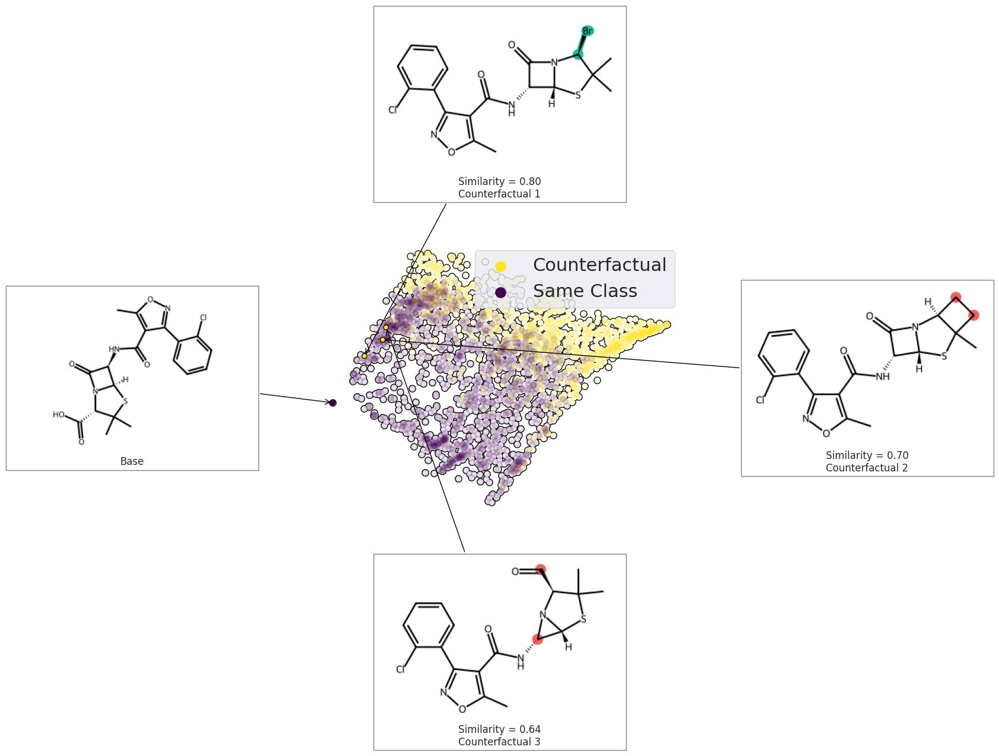

In [32]:
font = {"family": "normal", "weight": "normal", "size": 22}
exmol.plot_space(
    space,
    exps,
    figure_kwargs=fkw,
    mol_size=(300, 200),
    offset=0,
    cartoon=True,
    rasterized=True,
)
plt.scatter([], [], label="Counterfactual", s=150, color=plt.get_cmap("viridis")(1.0))
plt.scatter([], [], label="Same Class", s=150, color=plt.get_cmap("viridis")(0.0))
plt.legend(fontsize=22)
plt.tight_layout()
plt.savefig("rf-space.png", dpi=180)
svg = exmol.insert_svg(exps, mol_fontsize=14)
with open("svg_figs/rf-space.svg", "w") as f:
    f.write(svg)
skunk.display(svg)

In [33]:
from rdkit.Chem import MolFromSmiles as smi2mol
from rdkit.Chem import MolToSmiles as mol2smi
from rdkit.Chem.Draw import MolToImage as mol2img

dos = rdkit.Chem.Draw.MolDrawOptions()
dos.useBWAtomPalette()
# dos.minFontSize = fontsize
img = mol2img(smi2mol(exps[0].smiles), options=dos)
# img.save("rf-schem-1.png")

<ipython-input-34-da2500dfde2b>:9: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


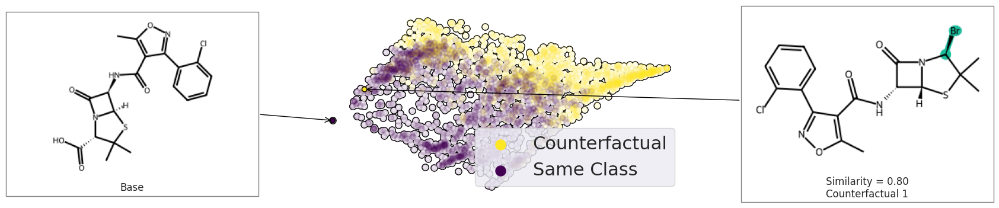

In [34]:
fkw = {"figsize": (8, 4)}
font = {"family": "normal", "weight": "normal", "size": 22, "dpi": 300}
exmol.plot_space(
    space, exps[:2], figure_kwargs=fkw, mol_size=(300, 200), offset=0, cartoon=True
)
plt.scatter([], [], label="Counterfactual", s=150, color=plt.get_cmap("viridis")(1.0))
plt.scatter([], [], label="Same Class", s=150, color=plt.get_cmap("viridis")(0.0))
plt.legend(fontsize=22)
plt.tight_layout()
plt.savefig("rf-schem-3.png", bbox_inches="tight", dpi=180)
svg = exmol.insert_svg(exps[:2], mol_fontsize=10)
with open("rf-scheme.svg", "w") as f:
    f.write(svg)
skunk.display(svg)

In [35]:
cspace = exmol.sample_space(
    "Cc1ccc(cc1Nc2nccc(n2)c3cccnc3)NC(=O)c4ccc(cc4)CN5CCN(CC5)C",
    model_eval,
    preset="medium",
    quiet=True,
)

In [36]:
kws = {"num_samples": 1500}
zspace = exmol.sample_space(
    "Cc1ccc(cc1Nc2nccc(n2)c3cccnc3)NC(=O)c4ccc(cc4)CN5CCN(CC5)C",
    model_eval,
    preset="chemed",
    method_kwargs=kws,
    quiet=True,
)

/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  r

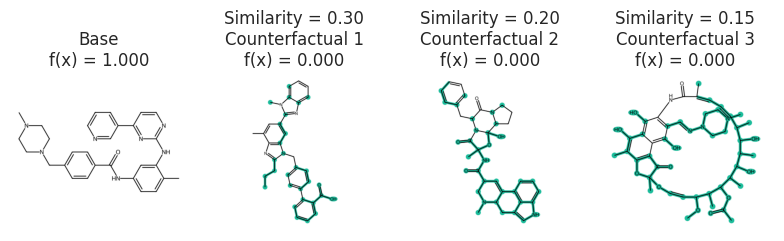

In [37]:
### Gleevec molecule
exps = exmol.cf_explain(zspace)
fkw = {"figsize": (8, 6)}
mpl.rc("axes", titlesize=12)
exmol.plot_cf(exps, figure_kwargs=fkw, mol_size=(450, 400), nrows=1)

FileNotFoundError: [Errno 2] No such file or directory: 'svg_figs/gleevec-cs.svg'

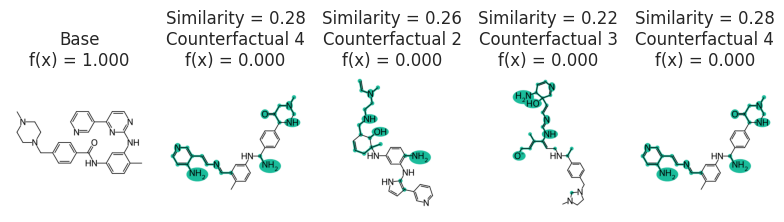

In [38]:
fkw = {"figsize": (8, 6)}
mpl.rc("axes", titlesize=12)
cfs = exmol.cf_explain(cspace, nmols=4)
exmol.plot_cf(cfs, figure_kwargs=fkw, mol_fontsize=26, mol_size=(400, 400), nrows=1)
plt.savefig("gleevec-cs.png", bbox_inches="tight", dpi=180)
svg = exmol.insert_svg(cfs)
with open("svg_figs/gleevec-cs.svg", "w") as f:
    f.write(svg)

FileNotFoundError: [Errno 2] No such file or directory: 'svg_figs/gleevec-simple.svg'

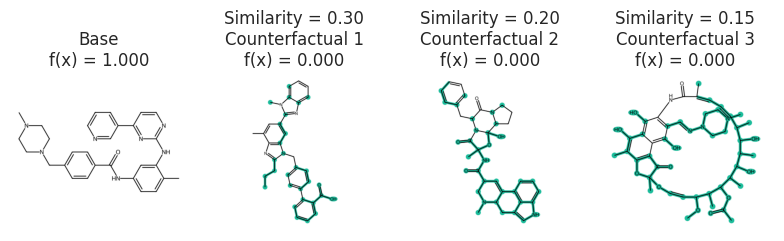

In [39]:
fkw = {"figsize": (8, 6)}
mpl.rc("axes", titlesize=12)
exmol.plot_cf(exps, figure_kwargs=fkw, mol_size=(450, 400), nrows=1)

plt.savefig("rf-simple.png", dpi=180)
svg = exmol.insert_svg(exps, mol_fontsize=14)
with open("svg_figs/gleevec-simple.svg", "w") as f:
    f.write(svg)

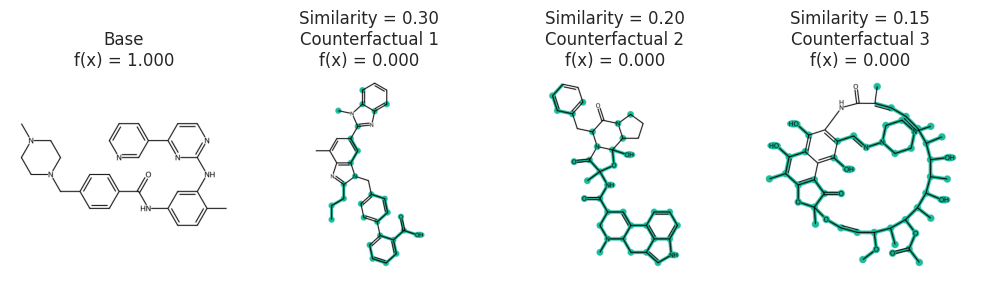

In [40]:
fkw = {"figsize": (10, 6)}
mpl.rc("axes", titlesize=12)
exmol.plot_cf(exps, figure_kwargs=fkw, mol_size=(450, 400), nrows=1)

zexps = exmol.cf_explain(zspace, nmols=5)

# **MMACE Paper: Graph Neural Network for HIV Inhibition**

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import numpy as np
import tensorflow as tf
import selfies as sf
import exmol
import skunk
import warnings
from rdkit import Chem
from rdkit.Chem.Draw import rdDepictor

rdDepictor.SetPreferCoordGen(True)
from rdkit.Chem.Draw import IPythonConsole

IPythonConsole.ipython_useSVG = True
sns.set_context("notebook")
sns.set_style(
    "dark",
    {
        "xtick.bottom": True,
        "ytick.left": True,
        "xtick.color": "#666666",
        "ytick.color": "#666666",
        "axes.edgecolor": "#666666",
        "axes.linewidth": 0.8,
        "figure.dpi": 300,
    },
)
color_cycle = ["#1BBC9B", "#F06060", "#F3B562", "#6e5687", "#5C4B51"]
mpl.rcParams["axes.prop_cycle"] = mpl.cycler(color=color_cycle)
np.random.seed(0)

In [43]:
# shuffle rows and sample fom HIV dataset
hivdata = pd.read_csv("HIV.csv")
# REDUCED Data FOR CI
hivdata = hivdata.sample(frac=0.1).reset_index(drop=True)
hivdata.head()

,smiles,activity,HIV_active
0,COc1ccc2c(c1)OCC1(C)c3cc(O)c(OCc4ccccc4)cc3OC21,CI,0
1,Cc1cc(-c2ccc(Cl)cc2)c(C#N)c(=S)n1C1OC(CO)C(O)C...,CI,0
2,CNn1c(-c2ccccc2)n[nH]c1=O,CM,1
3,O=NN(CCCl)C(=O)NC1CCCCC1,CI,0
4,C=C1CCC(C)(c2ccc(CO)cc2)C1C,CI,0


In [44]:
def gen_smiles2graph(sml):
    """Argument for the RD2NX function should be a valid SMILES sequence
    returns: the graph
    """
    m, smi_canon, status = exmol.stoned.sanitize_smiles(sml)
    # m = Chem.MolFromSmiles(smi_canon)
    m = Chem.AddHs(m)
    order_string = {
        Chem.rdchem.BondType.SINGLE: 1,
        Chem.rdchem.BondType.DOUBLE: 2,
        Chem.rdchem.BondType.TRIPLE: 3,
        Chem.rdchem.BondType.AROMATIC: 4,
    }
    N = len(list(m.GetAtoms()))
    # nodes = np.zeros((N,100))
    nodes = np.zeros((440, 100))
    for i in m.GetAtoms():
        nodes[i.GetIdx(), i.GetAtomicNum()] = 1

    # adj = np.zeros((N,N))
    adj = np.zeros((440, 440))
    for j in m.GetBonds():
        u = min(j.GetBeginAtomIdx(), j.GetEndAtomIdx())
        v = max(j.GetBeginAtomIdx(), j.GetEndAtomIdx())
        order = j.GetBondType()
        if order in order_string:
            order = order_string[order]
        else:
            raise Warning("Ignoring bond order" + order)
        adj[u, v] = 1
        adj[v, u] = 1
    adj += np.eye(440)
    return nodes, adj

In [45]:
class GCNLayer(tf.keras.layers.Layer):
    """Implementation of GCN as layer"""

    def __init__(self, activation=None, **kwargs):
        # constructor, which just calls super constructor
        # and turns requested activation into a callable function
        super(GCNLayer, self).__init__(**kwargs)
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # create trainable weights
        node_shape, adj_shape = input_shape
        self.w = self.add_weight(shape=(node_shape[2], node_shape[2]), name="w")

    def call(self, inputs):
        # split input into nodes, adj
        nodes, adj = inputs
        # compute degree
        degree = tf.reduce_sum(adj, axis=-1)
        # GCN equation
        new_nodes = tf.einsum("bi,bij,bjk,kl->bil", 1 / degree, adj, nodes, self.w)
        out = self.activation(new_nodes)
        return out, adj

In [46]:
class GRLayer(tf.keras.layers.Layer):
    """Reduction layer: A GNN layer that computes average over all node features"""

    def __init__(self, name="GRLayer", **kwargs):
        super(GRLayer, self).__init__(name=name, **kwargs)

    def call(self, inputs):
        nodes, adj = inputs
        reduction = tf.reduce_mean(nodes, axis=1)
        return reduction

In [47]:
ninput = tf.keras.Input(
    (
        None,
        100,
    )
)
ainput = tf.keras.Input(
    (
        None,
        None,
    )
)
# GCN block
x = GCNLayer("relu")([ninput, ainput])
x = GCNLayer("relu")(x)
x = GCNLayer("relu")(x)
x = GCNLayer("relu")(x)
# reduce to graph features
x = GRLayer()(x)
# standard layers
x = tf.keras.layers.Dense(256)(x)
x = tf.keras.layers.Dense(1, activation="sigmoid")(x)
gcnmodel = tf.keras.Model(inputs=(ninput, ainput), outputs=x)
gcnmodel.compile(
    "adam",
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
    metrics=["accuracy"],
)
gcnmodel.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, None, 100)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer_1             │ (None, None, None)     │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gcn_layer (GCNLayer)      │ [(None, None, 100),    │         10,000 │ input_layer[0][0],     │
│                           │ (None, None, None)]    │                │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gcn_layer_1 (GCNLayer)    │ [(None, None, 100),    │         10,000 │ gcn_layer[0][0],       │
│                           │ (None, None, None)]    │                │ gcn_layer[0][1]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gcn_layer_2 (GCNLayer)    │ [(None, None, 100),    │         10,000 │ gcn_layer_1[0][0],     │
│                           │ (None, None, None)]    │                │ gcn_layer_1[0][1]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gcn_layer_3 (GCNLayer)    │ [(None, None, 100),    │         10,000 │ gcn_layer_2[0][0],     │
│                           │ (None, None, None)]    │                │ gcn_layer_2[0][1]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRLayer (GRLayer)         │ (None, 100)            │              0 │ gcn_layer_3[0][0],     │
│                           │                        │                │ gcn_layer_3[0][1]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 256)            │         25,856 │ GRLayer[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 1)              │            257 │ dense[0][0]            │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 66,113 (258.25 KB)

 Trainable params: 66,113 (258.25 KB)

 Non-trainable params: 0 (0.00 B)

In [48]:
def gen_data():
    for i in range(len(hivdata)):
        graph = gen_smiles2graph(hivdata.smiles[i])
        activity = hivdata.HIV_active[i]
        yield graph, activity


data = tf.data.Dataset.from_generator(
    gen_data,
    output_types=((tf.float32, tf.float32), tf.float32),
    output_shapes=(
        (tf.TensorShape([None, 100]), tf.TensorShape([None, None])),
        tf.TensorShape([]),
    ),
)

In [49]:
N = len(hivdata)
split = int(0.1 * N)
test_data = data.take(split)
nontest = data.skip(split)
val_data, train_data = nontest.take(split), nontest.skip(split).shuffle(1000)

In [50]:
class_weight = {0: 1.0, 1: 30.0}  # to account for class imbalance
result = gcnmodel.fit(
    train_data.batch(128),
    validation_data=val_data.batch(128),
    epochs=30,
    verbose=0,
    class_weight=class_weight,
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


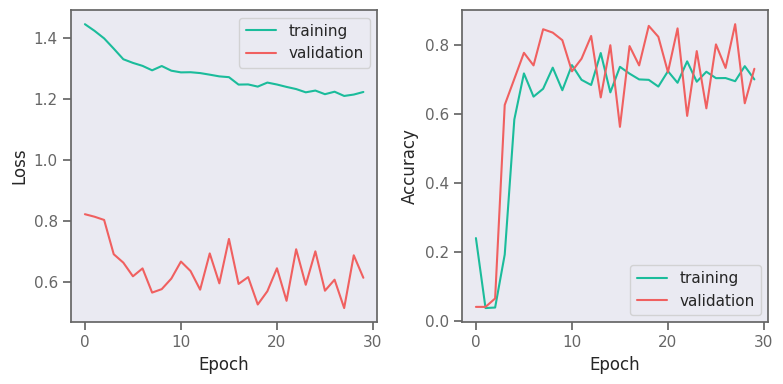

In [51]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
ax1.plot(result.history["loss"], label="training")
ax1.plot(result.history["val_loss"], label="validation")
ax1.legend()
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Loss")

ax2.plot(result.history["accuracy"], label="training")
ax2.plot(result.history["val_accuracy"], label="validation")
ax2.legend()
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Accuracy")
fig.tight_layout()
fig.savefig("gnn-loss-acc.png", dpi=180)
fig.show()

In [52]:
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

prediction = []
test_y = []

for x, y in test_data.as_numpy_iterator():
    yhat = gcnmodel((x[0][np.newaxis, ...], x[1][np.newaxis, ...]))
    prediction.append(yhat.numpy())
    test_y.append(y)

prediction = np.array(prediction).flatten()
test_y = np.array(test_y)

fpr_keras, tpr_keras, thresholds_keras = roc_curve(test_y, prediction)
auc_keras = auc(fpr_keras, tpr_keras)

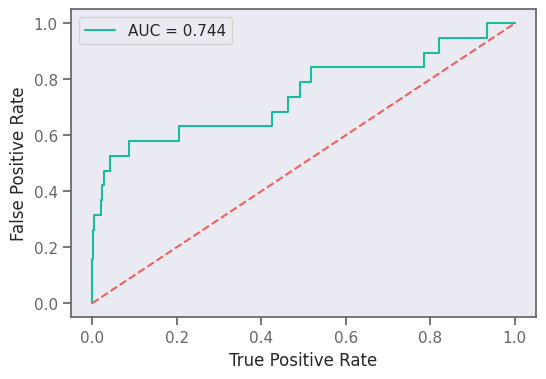

In [53]:
plt.figure(figsize=(6, 4), dpi=100)
plt.plot(fpr_keras, tpr_keras, label="AUC = {:.3f}".format(auc_keras))
plt.plot([0, 1], [0, 1], linestyle="--")
plt.xlabel("True Positive Rate")
plt.ylabel("False Positive Rate")
plt.legend()
plt.savefig("gnn-roc.png", dpi=300)
plt.show()

In [54]:
def predictor_function(smiles, selfies):
    # print('inut:',smiles)
    labels = []
    for sml in smiles:
        nodes, adj_mat = gen_smiles2graph(sml)
        pred = gcnmodel((nodes[np.newaxis, ...], adj_mat[np.newaxis, ...])).numpy()
        labels.append(pred)

    labels = np.array(labels).flatten()
    bin_labels = np.where(labels > 0.5, np.ones(len(labels)), np.zeros(len(labels)))
    target_act = np.zeros(len(labels))
    return abs(bin_labels - target_act).astype(bool)

In [55]:
basic = exmol.get_basic_alphabet()
stoned_kwargs = {"num_samples": 1500, "alphabet": basic, "max_mutations": 2}

In [56]:
example_base = "C=CCN(CC=C)C(=O)Nc1ccc(C(=O)NN=Cc2cccc(OC)c2OC)cc1"
space = exmol.sample_space(
    example_base,
    predictor_function,
    stoned_kwargs={"num_samples": 1500, "alphabet": basic, "max_mutations": 2},
    quiet=True,
)

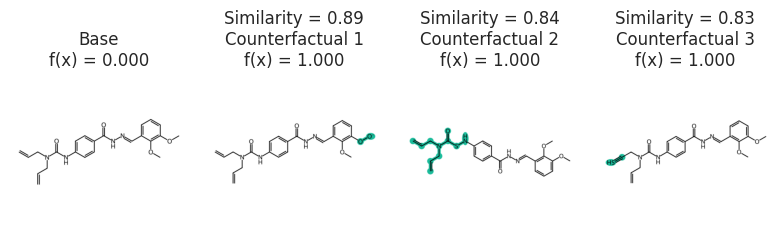

In [57]:
exps = exmol.cf_explain(space)
fkw = {"figsize": (8, 6)}
mpl.rc("axes", titlesize=12)
exmol.plot_cf(exps, figure_kwargs=fkw, mol_size=(450, 400), nrows=1)
plt.savefig("gnn-simple.png", dpi=180)
svg = exmol.insert_svg(exps, mol_fontsize=16)
with open("gnn-simple.svg", "w") as f:
    f.write(svg)

<ipython-input-58-e77d019a1760>:14: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


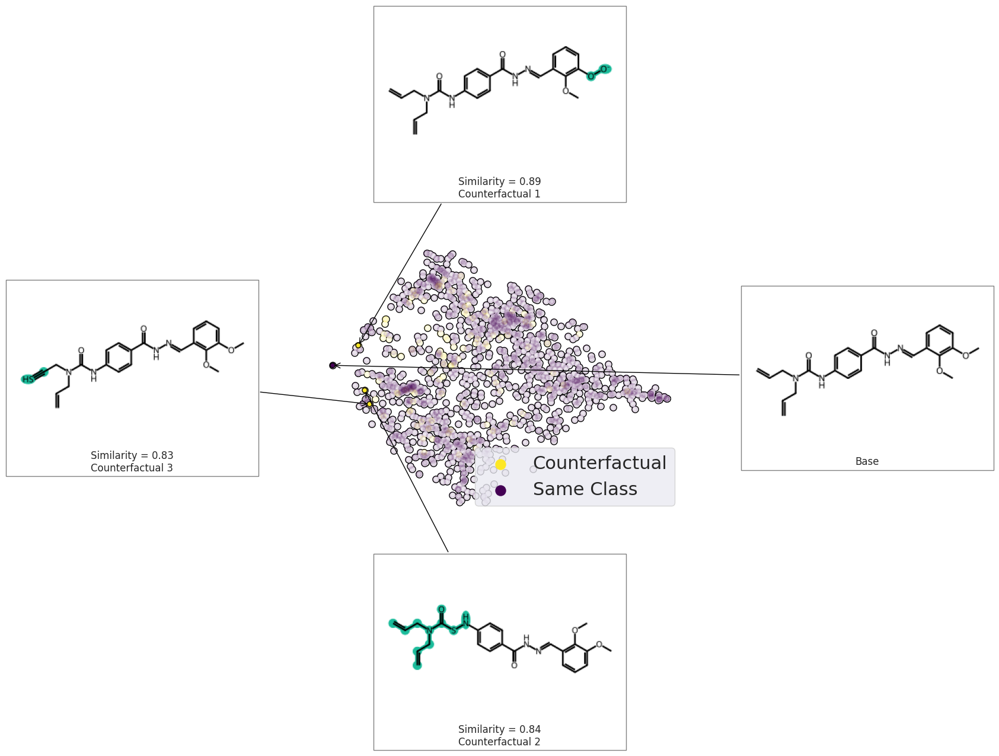

In [58]:
font = {"family": "normal", "weight": "normal", "size": 22}
exmol.plot_space(
    space,
    exps,
    figure_kwargs=fkw,
    mol_size=(300, 200),
    offset=0,
    cartoon=True,
    rasterized=True,
)
plt.scatter([], [], label="Counterfactual", s=150, color=plt.get_cmap("viridis")(1.0))
plt.scatter([], [], label="Same Class", s=150, color=plt.get_cmap("viridis")(0.0))
plt.legend(fontsize=22)
plt.tight_layout()
svg = exmol.insert_svg(exps, mol_fontsize=16)
with open("gnn-space.svg", "w") as f:
    f.write(svg)

In [59]:
exps = exmol.cf_explain(space, nmols=19)

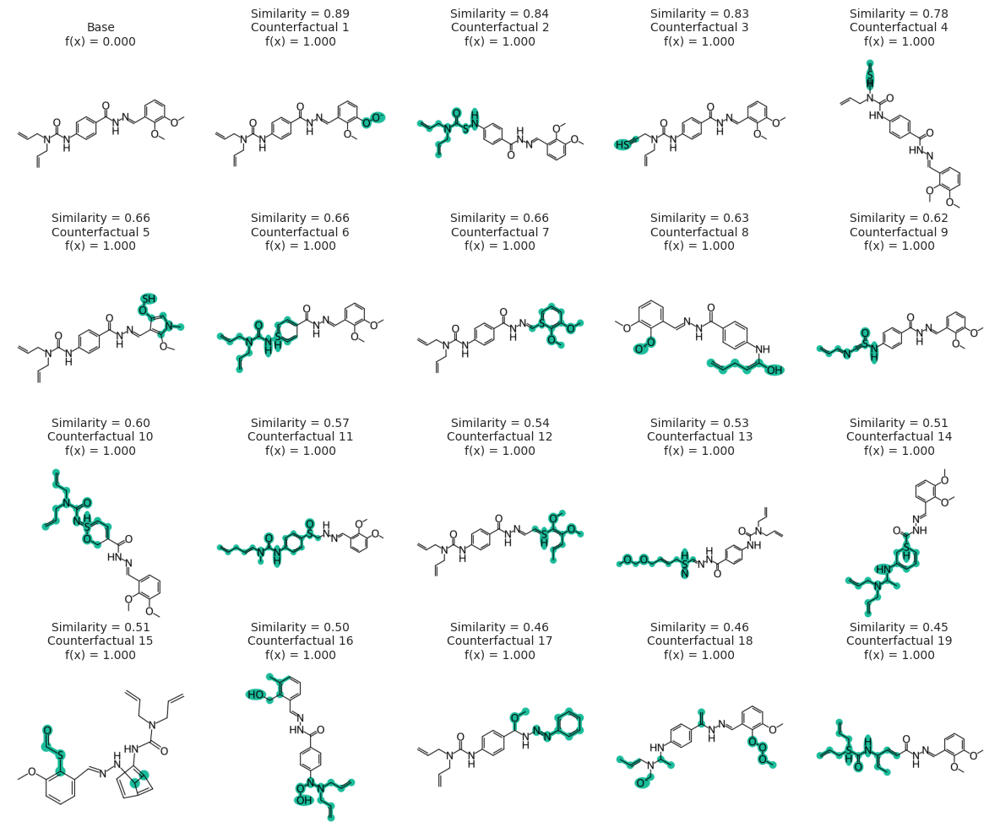

In [60]:
fkw = {"figsize": (12, 10)}
mpl.rc("axes", titlesize=10)
exmol.plot_cf(
    exps, figure_kwargs=fkw, mol_size=(450, 400), mol_fontsize=26, nrows=4, ncols=5
)
plt.savefig("gnn-simple-20.png", bbox_inches="tight", dpi=300)
svg = exmol.insert_svg(exps, mol_fontsize=14)
with open("gnn-simple-20.svg", "w") as f:
    f.write(svg)

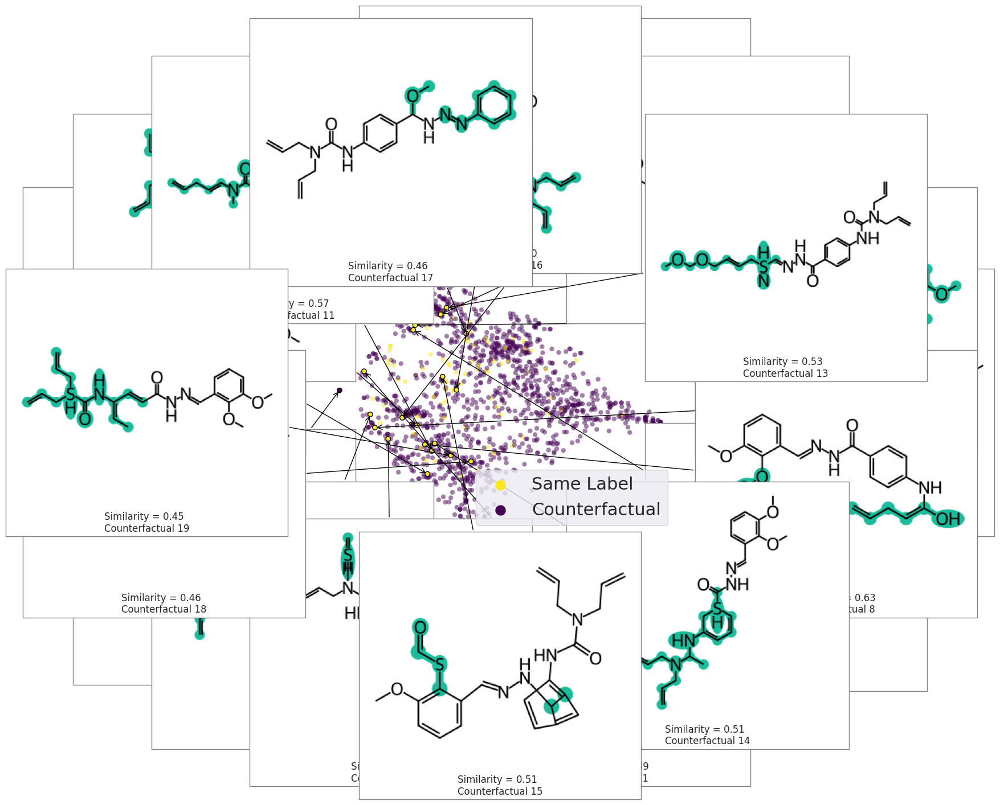

In [61]:
fkw = {"figsize": (8, 6)}
font = {"family": "normal", "weight": "normal", "size": 22}

exmol.plot_space(space, exps, figure_kwargs=fkw, mol_size=(350, 300), mol_fontsize=22)
plt.scatter([], [], label="Same Label", s=150, color=plt.get_cmap("viridis")(1.0))
plt.scatter([], [], label="Counterfactual", s=150, color=plt.get_cmap("viridis")(0.0))
plt.legend(fontsize=22)
plt.savefig("gnn-space.png", bbox_inches="tight", dpi=180)

# **LIME paper: Recurrent Neural Network for Solubility Prediciton**

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import tensorflow as tf
import selfies as sf
import exmol
from dataclasses import dataclass
from rdkit.Chem.Draw import rdDepictor, MolsToGridImage
from rdkit.Chem import MolFromSmiles
import random
rdDepictor.SetPreferCoordGen(True)
import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
import urllib.request

urllib.request.urlretrieve(
    "https://github.com/google/fonts/raw/main/ofl/ibmplexmono/IBMPlexMono-Regular.ttf",
    "IBMPlexMono-Regular.ttf",
)
fe = font_manager.FontEntry(fname="IBMPlexMono-Regular.ttf", name="plexmono")
font_manager.fontManager.ttflist.append(fe)
plt.rcParams.update(
    {
        "axes.facecolor": "#f5f4e9",
        "grid.color": "#AAAAAA",
        "axes.edgecolor": "#333333",
        "figure.facecolor": "#FFFFFF",
        "axes.grid": False,
        "axes.prop_cycle": plt.cycler("color", plt.cm.Dark2.colors),
        "font.family": fe.name,
        "figure.figsize": (3.5, 3.5 / 1.2),
        "ytick.left": True,
        "xtick.bottom": True,
    }
)
mpl.rcParams["font.size"] = 12
soldata = pd.read_csv(
    "https://github.com/whitead/dmol-book/raw/main/data/curated-solubility-dataset.csv"
)

features_start_at = list(soldata.columns).index("MolWt")
np.random.seed(0)
random.seed(0)

In [63]:
# scramble them
soldata = soldata.sample(frac=0.01, random_state=0).reset_index(drop=True)
soldata.head()

,ID,Name,InChI,InChIKey,SMILES,Solubility,SD,Ocurrences,Group,MolWt,...,NumRotatableBonds,NumValenceElectrons,NumAromaticRings,NumSaturatedRings,NumAliphaticRings,RingCount,TPSA,LabuteASA,BalabanJ,BertzCT
0,B-4206,diuron,InChI=1S/C9H10Cl2N2O/c1-13(2)9(14)12-6-3-4-7(1...,XMTQQYYKAHVGBJ-UHFFFAOYSA-N,CN(C)C(=O)Nc1ccc(Cl)c(Cl)c1,-3.744300,1.227164,5,G4,233.098,...,1.0,76.0,1.0,0.0,0.0,1.0,32.34,92.603980,2.781208,352.665233
1,F-988,7-(3-amino-3-methylazetidin-1-yl)-8-chloro-1-c...,InChI=1S/C17H17ClFN3O3/c1-17(20)6-21(7-17)14-1...,DUNZFXZSFJLIKR-UHFFFAOYSA-N,CC1(N)CN(C2=C(Cl)C3=C(C=C2F)C(=O)C(C(=O)O)=CN3...,-5.330000,0.000000,1,G1,365.792,...,3.0,132.0,2.0,2.0,2.0,4.0,88.56,147.136366,2.001398,973.487509
2,C-1996,4-acetoxybiphenyl; 4-biphenylyl acetate,InChI=1S/C14H12O2/c1-11(15)16-14-9-7-13(8-10-1...,MISFQCBPASYYGV-UHFFFAOYSA-N,CC(=O)OC1=CC=C(C=C1)C2=CC=CC=C2,-4.400000,0.000000,1,G1,212.248,...,2.0,80.0,2.0,0.0,0.0,2.0,26.30,94.493449,2.228677,471.848345
3,A-3055,methane dimolybdenum,InChI=1S/CH4.2Mo/h1H4;;,JAGQSESDQXCFCH-UHFFFAOYSA-N,C.[Mo].[Mo],-3.420275,0.409223,2,G3,207.923,...,0.0,20.0,0.0,0.0,0.0,0.0,0.00,49.515427,-0.000000,2.754888
4,A-2575,ethyl 4-[[(methylphenylamino)methylene]amino]b...,InChI=1S/C17H18N2O2/c1-3-21-17(20)14-9-11-15(1...,GNGYPJUKIKDJQT-UHFFFAOYSA-N,CCOC(=O)c1ccc(cc1)N=CN(C)c2ccccc2,-5.450777,0.000000,1,G1,282.343,...,5.0,108.0,2.0,0.0,0.0,2.0,41.90,124.243431,2.028889,606.447052


In [64]:
from rdkit.Chem import MolToSmiles


def _randomize_smiles(mol, isomericSmiles=True):
    return MolToSmiles(
        mol,
        canonical=False,
        doRandom=True,
        isomericSmiles=isomericSmiles,
        kekuleSmiles=random.random() < 0.5,
    )

In [65]:
smiles = list(soldata["SMILES"])
solubilities = list(soldata["Solubility"])

aug_data = 10


def largest_mol(smiles):
    ss = smiles.split(".")
    ss.sort(key=lambda a: len(a))
    return ss[-1]


aug_smiles = []
aug_solubilities = []
for sml, sol in zip(smiles, solubilities):
    sml = largest_mol(sml)
    if len(sml) <= 4:
        continue  # ion or metal
    new_smls = []
    new_smls.append(sml)
    aug_solubilities.append(sol)
    for _ in range(aug_data):
        try:
            new_sml = _randomize_smiles(MolFromSmiles(sml))
            if new_sml not in new_smls:
                new_smls.append(new_sml)
                aug_solubilities.append(sol)
        except:
            continue
    aug_smiles.extend(new_smls)

aug_df_AqSolDB = pd.DataFrame(
    data={"SMILES": aug_smiles, "Solubility": aug_solubilities}
)

print(f"The dataset was augmented from {len(soldata)} to {len(aug_df_AqSolDB)}.")

The dataset was augmented from 100 to 996.


In [66]:
selfies_list = []
for s in aug_df_AqSolDB.SMILES:
    try:
        selfies_list.append(sf.encoder(exmol.sanitize_smiles(s)[1]))
    except sf.EncoderError:
        selfies_list.append(None)
len(selfies_list)

996

In [67]:
basic = set(exmol.get_basic_alphabet())
data_vocab = set(
    sf.get_alphabet_from_selfies([s for s in selfies_list if s is not None])
)
vocab = ["[nop]"]
vocab.extend(list(data_vocab.union(basic)))
vocab_stoi = {o: i for o, i in zip(vocab, range(len(vocab)))}


def selfies2ints(s):
    result = []
    for token in sf.split_selfies(s):
        if token in vocab_stoi:
            result.append(vocab_stoi[token])
        else:
            result.append(np.nan)
            # print('Warning')
    return result


def ints2selfies(v):
    return "".join([vocab[i] for i in v])


# test them out
s = selfies_list[0]
print("selfies:", s)
v = selfies2ints(s)
print("selfies2ints:", v)
so = ints2selfies(v)

selfies: [C][N][Branch1][C][C][C][=Branch1][C][=O][N][C][=C][C][=C][Branch1][C][Cl][C][Branch1][C][Cl][=C][Ring1][Branch2]
selfies2ints: [27, 38, 35, 27, 27, 27, 47, 27, 28, 38, 27, 16, 27, 16, 35, 27, 30, 27, 35, 27, 30, 16, 4, 7]


In [68]:
# creating an object
@dataclass
class Config:
    vocab_size: int
    example_number: int
    batch_size: int
    buffer_size: int
    embedding_dim: int
    rnn_units: int
    hidden_dim: int
    drop_rate: float


config = Config(
    vocab_size=len(vocab),
    example_number=len(selfies_list),
    batch_size=128,
    buffer_size=10000,
    embedding_dim=64,
    hidden_dim=32,
    rnn_units=64,
    drop_rate=0.20,
)

In [69]:
# now get sequences
encoded = [selfies2ints(s) for s in selfies_list if s is not None]
# check for non-Nones
dsolubilities = aug_df_AqSolDB.Solubility.values[[s is not None for s in selfies_list]]
padded_seqs = tf.keras.preprocessing.sequence.pad_sequences(encoded, padding="post")

# Should be shuffled from the beginning, so no worries
N = len(padded_seqs)
split = int(0.1 * N)

# Now build dataset
test_data = tf.data.Dataset.from_tensor_slices(
    (padded_seqs[:split], dsolubilities[:split])
).batch(config.batch_size)

nontest = tf.data.Dataset.from_tensor_slices(
    (
        padded_seqs[split:],
        dsolubilities[split:],
    )
)
val_data, train_data = nontest.take(split).batch(config.batch_size), nontest.skip(
    split
).shuffle(config.buffer_size).batch(config.batch_size).prefetch(
    tf.data.experimental.AUTOTUNE
)

In [70]:
model = tf.keras.Sequential()

# make embedding and indicate that 0 should be treated as padding mask
model.add(
    tf.keras.layers.Embedding(
        input_dim=config.vocab_size, output_dim=config.embedding_dim, mask_zero=True
    )
)
model.add(tf.keras.layers.Dropout(config.drop_rate))
# RNN layer
model.add(tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(config.rnn_units)))
model.add(tf.keras.layers.Dropout(config.drop_rate))
# a dense hidden layer
model.add(tf.keras.layers.Dense(config.hidden_dim, activation="relu"))
model.add(tf.keras.layers.Dropout(config.drop_rate))
# regression, so no activation
model.add(tf.keras.layers.Dense(1))

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ ?                           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ ?                           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ ?                           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [72]:
model.compile(tf.optimizers.Adam(1e-3), loss="mean_squared_error")
# verbose=0 silences output, to get progress bar set verbose=1
result = model.fit(train_data, validation_data=val_data, epochs=50)

Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - loss: 12.4006 - val_loss: 2.0989
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 181ms/step - loss: 5.9997 - val_loss: 2.4144
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 180ms/step - loss: 4.6148 - val_loss: 0.6680
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - loss: 4.3903 - val_loss: 0.7389
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - loss: 4.0310 - val_loss: 0.9038
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 292ms/step - loss: 3.7583 - val_loss: 0.5238
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 183ms/step - loss: 3.4738 - val_loss: 0.9499
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - loss: 2.8615 - val_loss: 0.6454
Epoch 9/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step - loss: 2.6461 - val_loss: 0.8935
Epoch 10/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 181ms/step - loss: 2.3451 - val_loss: 0.8796
Epoch 11/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 322ms/step - loss: 2.1741 - val_loss: 0.7155
Epoch 12/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 281ms/step - loss: 2.1377 - val_l

In [73]:
model.save("solubility-rnn-accurate")
# model = tf.keras.models.load_model('solubility-rnn-accurate/')

ValueError: Invalid filepath extension for saving. Please add either a `.keras` extension for the native Keras format (recommended) or a `.h5` extension. Use `model.export(filepath)` if you want to export a SavedModel for use with TFLite/TFServing/etc. Received: filepath=solubility-rnn-accurate.

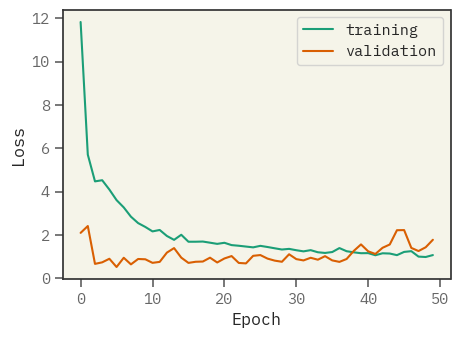

In [74]:
plt.figure(figsize=(5, 3.5))
plt.plot(result.history["loss"], label="training")
plt.plot(result.history["val_loss"], label="validation")
plt.legend()
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.savefig("rnn-loss.png", bbox_inches="tight", dpi=300)
plt.show()

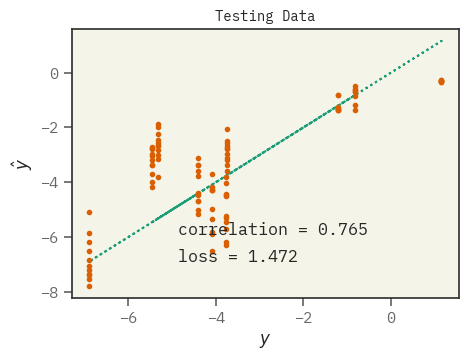

In [75]:
yhat = []
test_y = []
for x, y in test_data:
    yhat.extend(model(x).numpy().flatten())
    test_y.extend(y.numpy().flatten())
yhat = np.array(yhat)
test_y = np.array(test_y)

# plot test data
plt.figure(figsize=(5, 3.5))
plt.plot(test_y, test_y, ":")
plt.plot(test_y, yhat, ".")
plt.text(
    max(test_y) - 6,
    min(test_y) + 1,
    f"correlation = {np.corrcoef(test_y, yhat)[0,1]:.3f}",
)
plt.text(
    max(test_y) - 6, min(test_y), f"loss = {np.sqrt(np.mean((test_y - yhat)**2)):.3f}"
)
plt.xlabel(r"$y$")
plt.ylabel(r"$\hat{y}$")
plt.title("Testing Data")
plt.savefig("rnn-fit.png", dpi=300, bbox_inches="tight")
plt.show()

In [76]:
# Predictor function is used as input to sample_space function
def predictor_function(smile_list, selfies):
    encoded = [selfies2ints(s) for s in selfies]
    # check for nans
    valid = [1.0 if sum(e) > 0 else np.nan for e in encoded]
    encoded = [np.nan_to_num(e, nan=0) for e in encoded]
    padded_seqs = tf.keras.preprocessing.sequence.pad_sequences(encoded, padding="post")
    labels = np.reshape(model(padded_seqs, training=False), (-1))
    return labels * valid

In [77]:
# Make sure SMILES doesn't contain multiple fragments
smi = "CCCCC(=O)N(CC1=CC=C(C=C1)C2=C(C=CC=C2)C3=NN=N[NH]3)C(C(C)C)C(O)=O"  # mol1 - not soluble
# smi = "CC(CC(=O)NC1=CC=CC=C1)C(=O)O" #mol2 - highly soluble
af = exmol.get_basic_alphabet()
stoned_kwargs = {
    "num_samples": 5000,
    "alphabet": af,
    "max_mutations": 2,
}
space = exmol.sample_space(
    smi, predictor_function, stoned_kwargs=stoned_kwargs, quiet=True
)
print(len(space))

4165


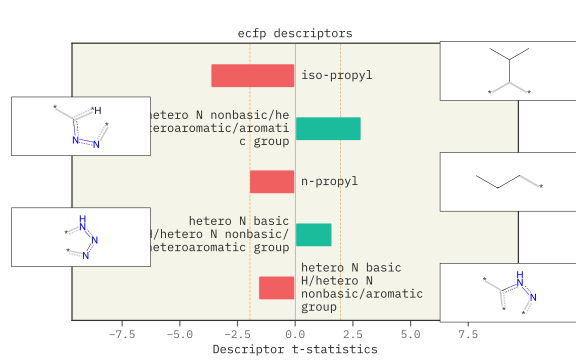

SMARTS annotations for MACCS descriptors were created using SMARTSviewer (smartsview.zbh.uni-hamburg.de, Copyright: ZBH, Center for Bioinformatics Hamburg) developed by K. Schomburg et. al. (J. Chem. Inf. Model. 2010, 50, 9, 1529–1535)


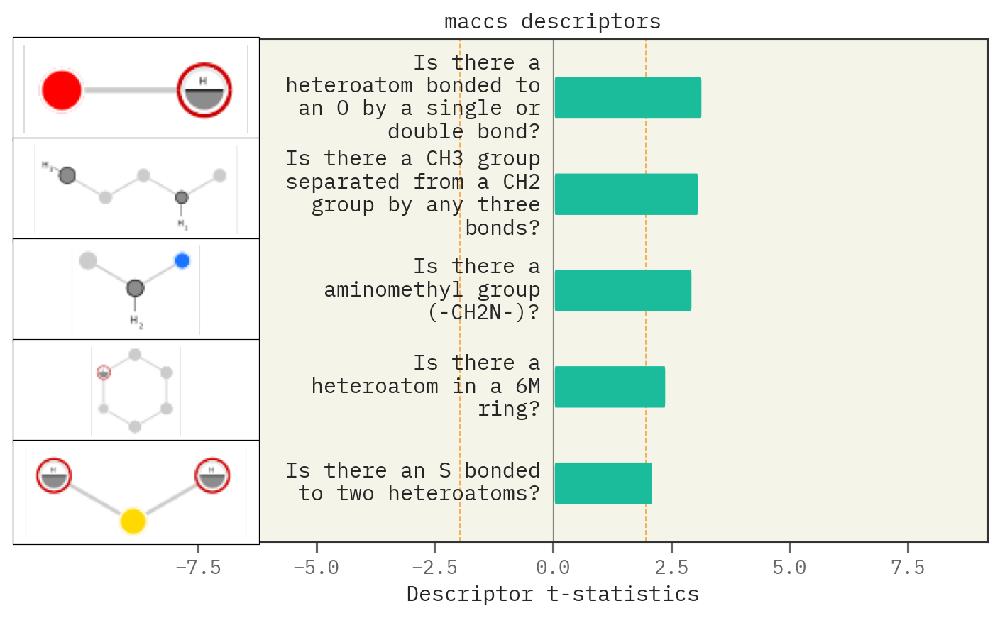

In [78]:
from IPython.display import display, SVG

desc_type = ["Classic", "ecfp", "maccs"]

for d in desc_type:
    beta = exmol.lime_explain(space, descriptor_type=d)
    if d == "ecfp":
        display(
            SVG(
                exmol.plot_descriptors(
                    space, output_file=f"{d}_mol2.svg", return_svg=True
                )
            )
        )
        plt.close()
    else:
        exmol.plot_descriptors(space, output_file=f"{d}_mol2.svg")

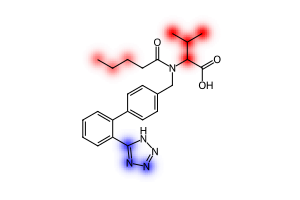

In [80]:
beta = exmol.lime_explain(space, "ecfp")
svg = exmol.plot_utils.similarity_map_using_tstats(space[0], return_svg=True)
display(SVG(svg))

In [81]:
# Write figure to file
with open("ecfp_similarity_map_mol2.svg", "w") as f:
    f.write(svg)

/usr/local/lib/python3.11/dist-packages/rdkit/Chem/Draw/IPythonConsole.py:343: UserWarning: Truncating the list of molecules to be displayed to 100. Change the maxMols value to display more.
  warnings.warn(


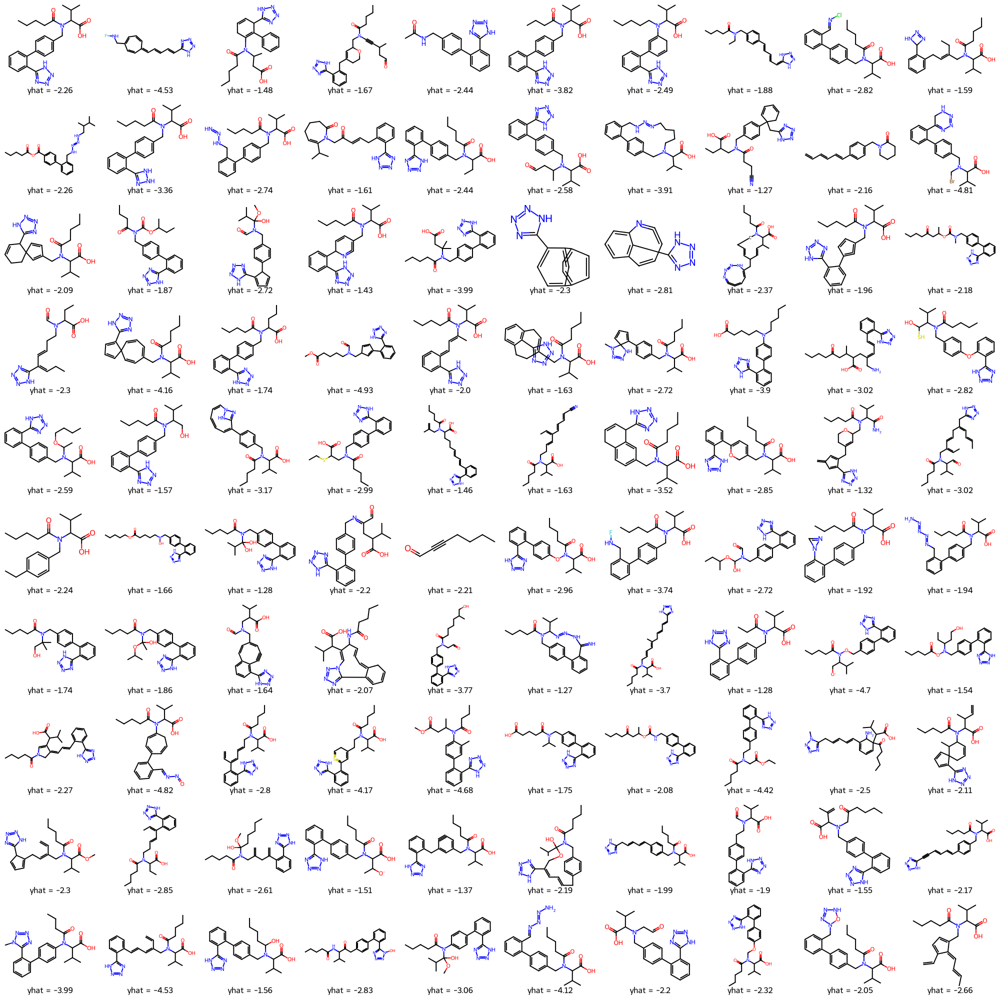

In [82]:
# Inspect space
MolsToGridImage(
    [MolFromSmiles(m.smiles) for m in space],
    legends=[f"yhat = {m.yhat:.3}" for m in space],
    molsPerRow=10,
    maxMols=100,
)

<ipython-input-83-b15e1c6fb977>:60: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = ax_dict["A"].scatter(ys, y_wls, s=50, marker=".", c=cmap, cmap=cmap)
<ipython-input-83-b15e1c6fb977>:71: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


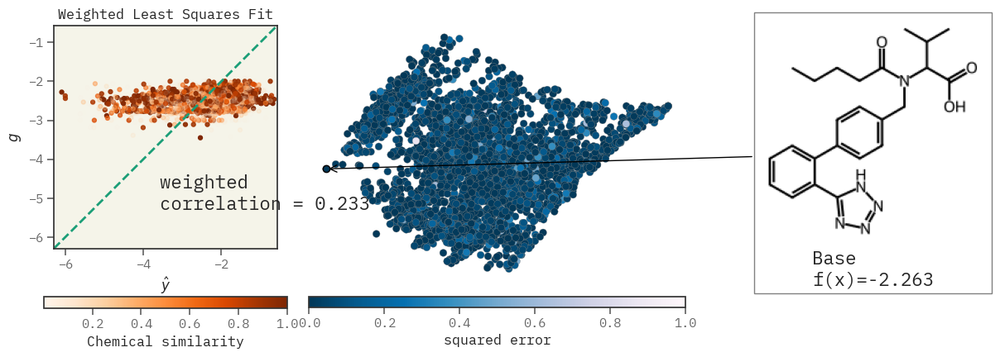

In [83]:
fkw = {"figsize": (6, 4)}
font = {"family": "normal", "weight": "normal", "size": 16}

fig = plt.figure(figsize=(10, 5))
mpl.rc("axes", titlesize=12)
mpl.rc("font", size=16)
ax_dict = fig.subplot_mosaic("AABBB")

# Plot space by fit
svg = exmol.plot_utils.plot_space_by_fit(
    space,
    [space[0]],
    figure_kwargs=fkw,
    mol_size=(200, 200),
    offset=1,
    ax=ax_dict["B"],
    beta=beta,
)
# Compute y_wls
w = np.array([1 / (1 + (1 / (e.similarity + 0.000001) - 1) ** 5) for e in space])
non_zero = w > 10 ** (-6)
w = w[non_zero]
N = w.shape[0]

ys = np.array([e.yhat for e in space])[non_zero].reshape(N).astype(float)
x_mat = np.array([list(e.descriptors.descriptors) for e in space])[non_zero].reshape(
    N, -1
)
y_wls = x_mat @ beta
y_wls += np.mean(ys)

lower = np.min(ys)
higher = np.max(ys)

# set transparency using w
norm = plt.Normalize(min(w), max(w))
cmap = plt.cm.Oranges(w)
cmap[:, -1] = w


def weighted_mean(x, w):
    return np.sum(x * w) / np.sum(w)


def weighted_cov(x, y, w):
    return np.sum(w * (x - weighted_mean(x, w)) * (y - weighted_mean(y, w))) / np.sum(w)


def weighted_correlation(x, y, w):
    return weighted_cov(x, y, w) / np.sqrt(
        weighted_cov(x, x, w) * weighted_cov(y, y, w)
    )


corr = weighted_correlation(ys, y_wls, w)

ax_dict["A"].plot(
    np.linspace(lower, higher, 100), np.linspace(lower, higher, 100), "--", linewidth=2
)
sc = ax_dict["A"].scatter(ys, y_wls, s=50, marker=".", c=cmap, cmap=cmap)
ax_dict["A"].text(max(ys) - 3, min(ys) + 1, f"weighted \ncorrelation = {corr:.3f}")
ax_dict["A"].set_xlabel(r"$\hat{y}$")
ax_dict["A"].set_ylabel(r"$g$")
ax_dict["A"].set_title("Weighted Least Squares Fit")
ax_dict["A"].set_xlim(lower, higher)
ax_dict["A"].set_ylim(lower, higher)
ax_dict["A"].set_aspect(1.0 / ax_dict["A"].get_data_ratio(), adjustable="box")
sm = plt.cm.ScalarMappable(cmap=plt.cm.Oranges, norm=norm)
cbar = plt.colorbar(sm, orientation="horizontal", pad=0.15, ax=ax_dict["A"])
cbar.set_label("Chemical similarity")
plt.tight_layout()
plt.savefig("weighted_fit.svg", dpi=300, bbox_inches="tight", transparent=False)

In [84]:
# Sample a big space
stoned_kwargs = {
    "num_samples": 5000,
    "alphabet": exmol.get_basic_alphabet(),
    "max_mutations": 2,
}
space = exmol.sample_space(
    smi, predictor_function, stoned_kwargs=stoned_kwargs, quiet=True
)
len(space)

4199

In [85]:
# get descriptor attributions
exmol.lime_explain(space, "MACCS", return_beta=False)

In [86]:
# Assign feature ids for rank comparison
features = features = {
    a: b
    for a, b in zip(
        space[0].descriptors.descriptor_names,
        np.arange(len(space[0].descriptors.descriptors)),
    )
}

In [87]:
# Get set of ranks for the reference space
baseline_imp = {
    a: b
    for a, b in zip(space[0].descriptors.descriptor_names, space[0].descriptors.tstats)
    if not np.isnan(b)
}
baseline_imp = dict(
    sorted(baseline_imp.items(), key=lambda item: abs(item[1]), reverse=True)
)
baseline_set = [features[x] for x in baseline_imp.keys()]

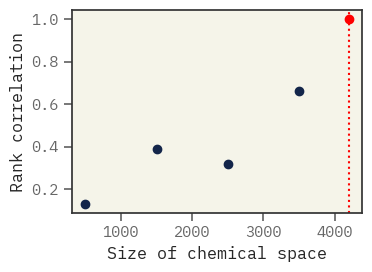

In [88]:
# Get subsets and calculate lime importances - subsample - get rank correlation
from scipy.stats import spearmanr

plt.figure(figsize=(4, 3))
N = len(space)
size = np.arange(500, N, 1000)
rank_corr = {N: 1}
for i, f in enumerate(size):
    # subsample space
    rank_corr[f] = []
    for _ in range(10):
        # subsample space of size f
        idx = np.random.choice(np.arange(N), size=f, replace=False)
        subspace = [space[i] for i in idx]
        # get desc attributions
        ss_beta = exmol.lime_explain(subspace, descriptor_type="MACCS")
        ss_imp = {
            a: b
            for a, b in zip(
                subspace[0].descriptors.descriptor_names, subspace[0].descriptors.tstats
            )
            if not np.isnan(b)
        }
        ss_imp = dict(
            sorted(ss_imp.items(), key=lambda item: abs(item[1]), reverse=True)
        )
        ss_set = [features[x] for x in ss_imp.keys()]
        # Get ranks for subsampled space and compare with reference
        ranks = {a: [b] for a, b in zip(baseline_set[:5], np.arange(1, 6))}
        for j, s in enumerate(ss_set):
            if s in ranks:
                ranks[s].append(j + 1)
        # compute rank correlation
        r = spearmanr(np.arange(1, 6), [ranks[x][1] for x in ranks])
        rank_corr[f].append(r.correlation)

    plt.scatter(f, np.mean(rank_corr[f]), color="#13254a", marker="o")

plt.scatter(N, 1.0, color="red", marker="o")
plt.axvline(x=N, linestyle=":", color="red")
plt.xlabel("Size of chemical space")
plt.ylabel("Rank correlation")
plt.tight_layout()
plt.savefig("rank correlation.svg", dpi=300, bbox_inches="tight")

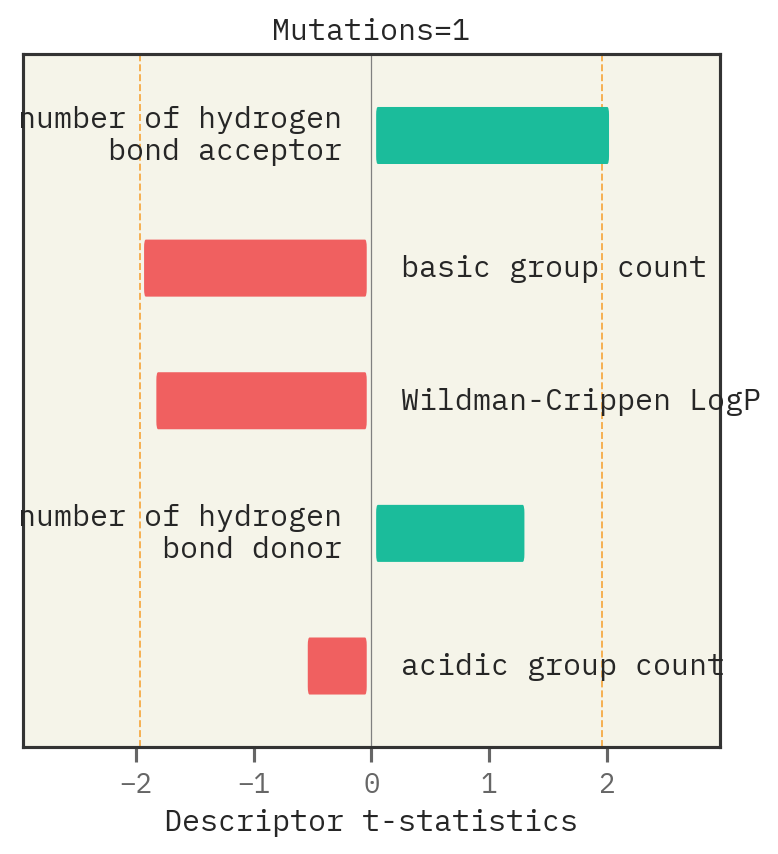

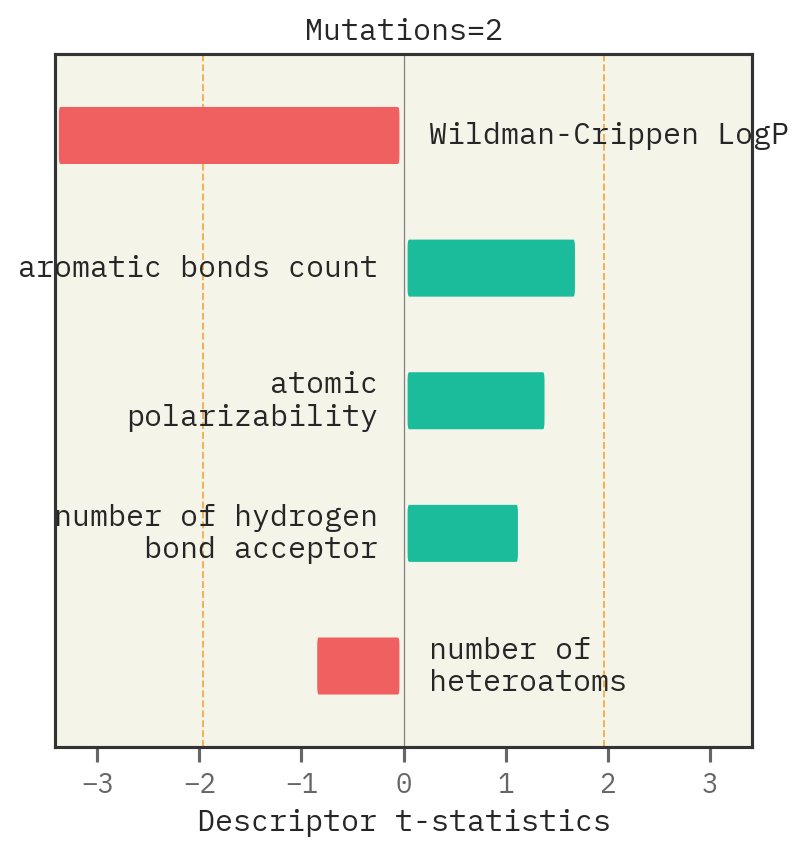

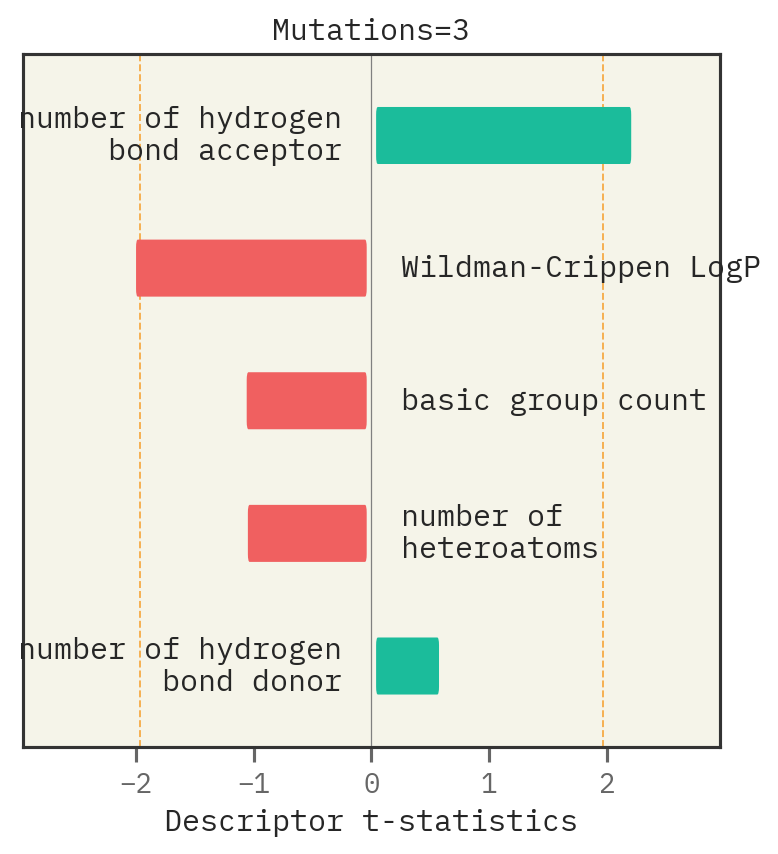

In [89]:
# Mutation
desc_type = ["Classic"]
muts = [1, 2, 3]
for i in muts:
    stoned_kwargs = {
        "num_samples": 2500,
        "alphabet": exmol.get_basic_alphabet(),
        "min_mutations": i,
        "max_mutations": i,
    }
    space = exmol.sample_space(
        smi, predictor_function, stoned_kwargs=stoned_kwargs, quiet=True
    )
    for d in desc_type:
        exmol.lime_explain(space, descriptor_type=d)
        exmol.plot_descriptors(space, title=f"Mutations={i}")

SMARTS annotations for MACCS descriptors were created using SMARTSviewer (smartsview.zbh.uni-hamburg.de, Copyright: ZBH, Center for Bioinformatics Hamburg) developed by K. Schomburg et. al. (J. Chem. Inf. Model. 2010, 50, 9, 1529–1535)
SMARTS annotations for MACCS descriptors were created using SMARTSviewer (smartsview.zbh.uni-hamburg.de, Copyright: ZBH, Center for Bioinformatics Hamburg) developed by K. Schomburg et. al. (J. Chem. Inf. Model. 2010, 50, 9, 1529–1535)
SMARTS annotations for MACCS descriptors were created using SMARTSviewer (smartsview.zbh.uni-hamburg.de, Copyright: ZBH, Center for Bioinformatics Hamburg) developed by K. Schomburg et. al. (J. Chem. Inf. Model. 2010, 50, 9, 1529–1535)


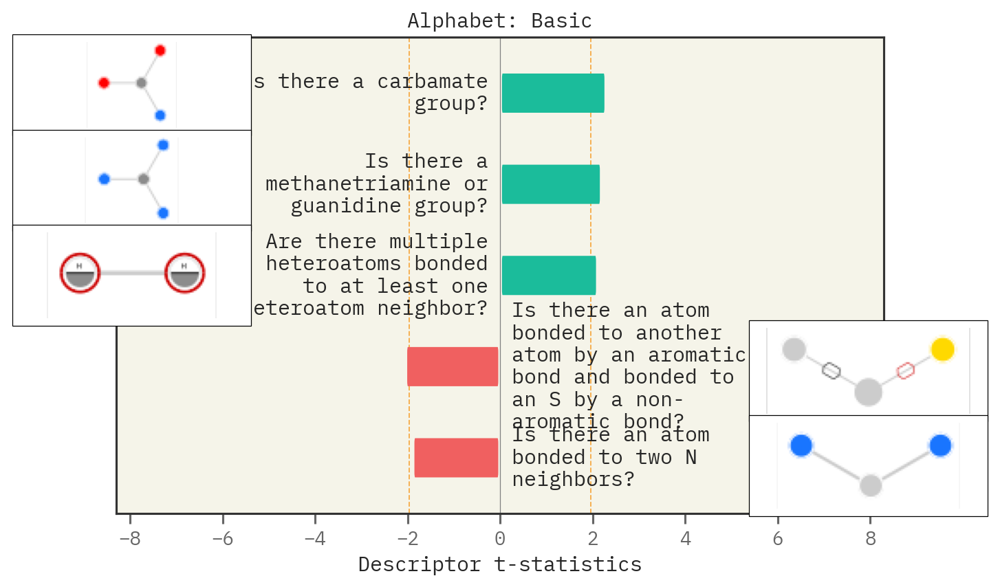

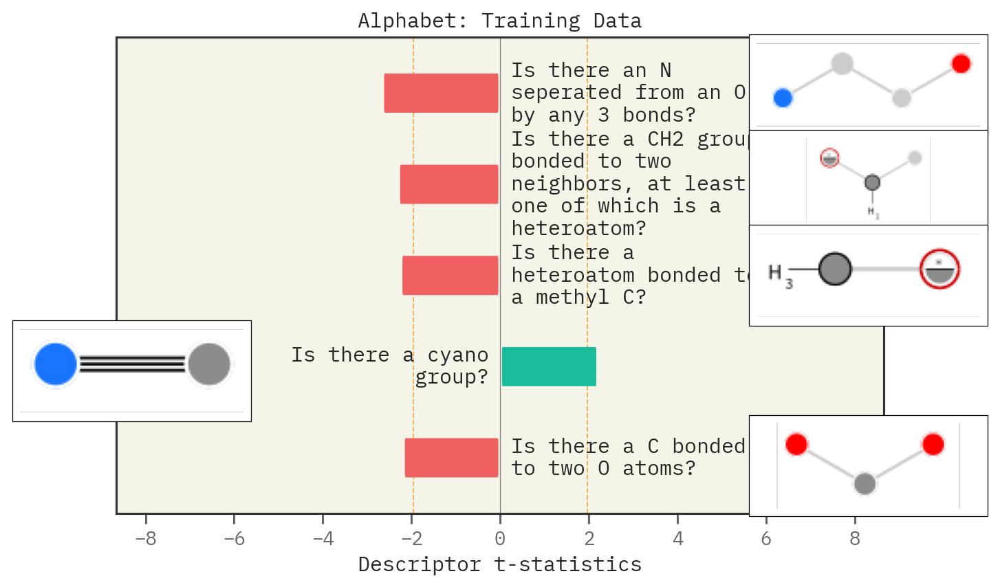

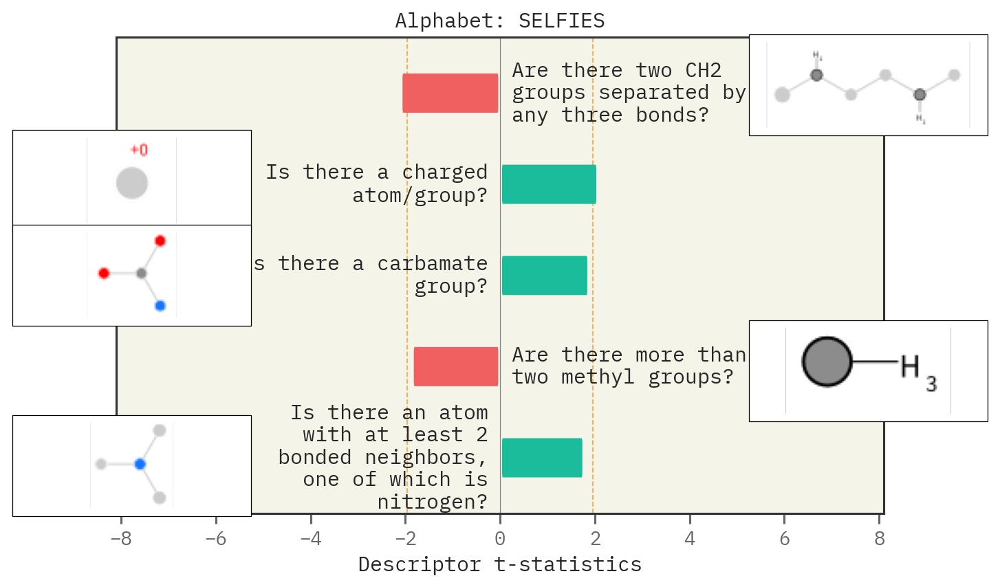

In [90]:
# Alphabet
basic = exmol.get_basic_alphabet()
train = sf.get_alphabet_from_selfies([s for s in selfies_list if s is not None])
wide = sf.get_semantic_robust_alphabet()
desc_type = ["MACCS"]
alphs = {"Basic": basic, "Training Data": train, "SELFIES": wide}
for a in alphs:
    stoned_kwargs = {"num_samples": 2500, "alphabet": alphs[a], "max_mutations": 2}
    space = exmol.sample_space(
        smi, predictor_function, stoned_kwargs=stoned_kwargs, quiet=True
    )
    for d in desc_type:
        exmol.lime_explain(space, descriptor_type=d)
        exmol.plot_descriptors(space, title=f"Alphabet: {a}")

SMARTS annotations for MACCS descriptors were created using SMARTSviewer (smartsview.zbh.uni-hamburg.de, Copyright: ZBH, Center for Bioinformatics Hamburg) developed by K. Schomburg et. al. (J. Chem. Inf. Model. 2010, 50, 9, 1529–1535)
SMARTS annotations for MACCS descriptors were created using SMARTSviewer (smartsview.zbh.uni-hamburg.de, Copyright: ZBH, Center for Bioinformatics Hamburg) developed by K. Schomburg et. al. (J. Chem. Inf. Model. 2010, 50, 9, 1529–1535)
SMARTS annotations for MACCS descriptors were created using SMARTSviewer (smartsview.zbh.uni-hamburg.de, Copyright: ZBH, Center for Bioinformatics Hamburg) developed by K. Schomburg et. al. (J. Chem. Inf. Model. 2010, 50, 9, 1529–1535)


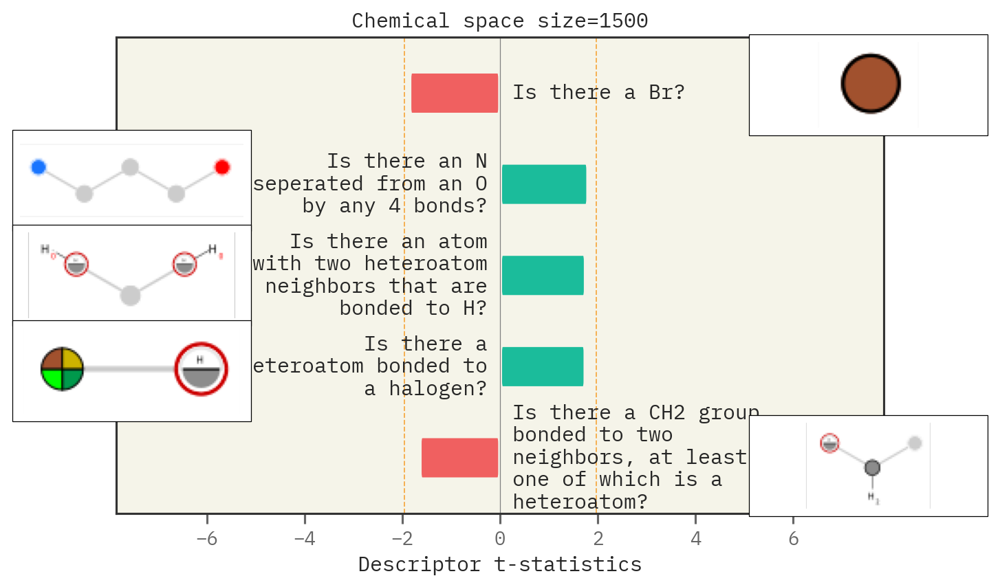

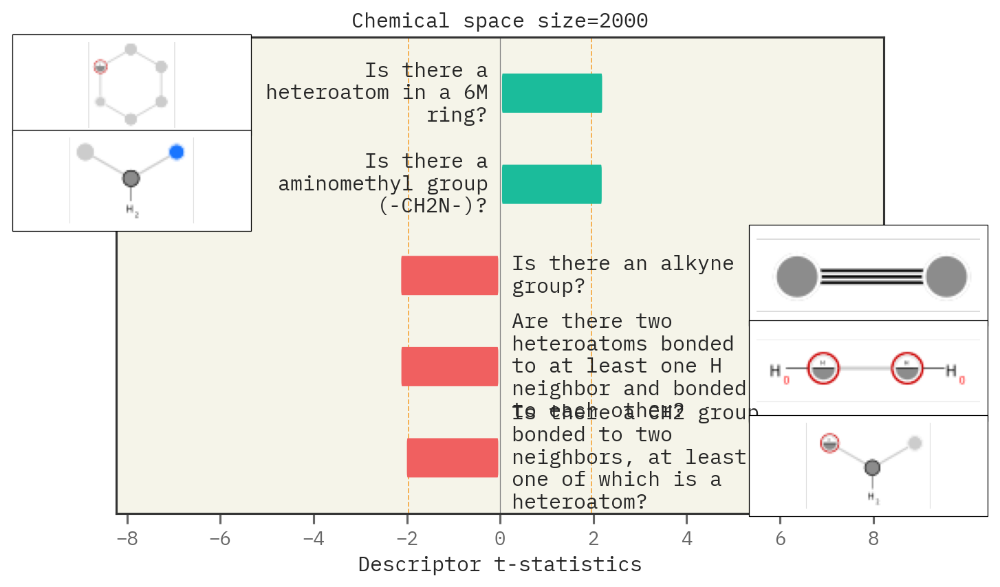

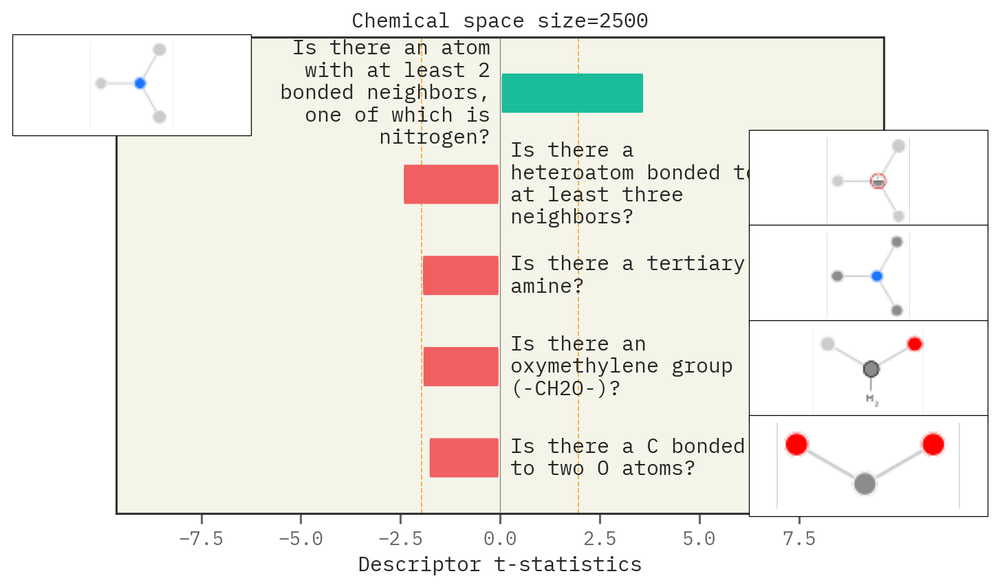

In [91]:
# Size of space
desc_type = ["MACCS"]
space_size = [1500, 2000, 2500]
for s in space_size:
    stoned_kwargs = {
        "num_samples": s,
        "alphabet": exmol.get_basic_alphabet(),
        "max_mutations": 2,
    }
    space = exmol.sample_space(
        smi, predictor_function, stoned_kwargs=stoned_kwargs, quiet=True
    )
    for d in desc_type:
        exmol.lime_explain(space, descriptor_type=d)
        exmol.plot_descriptors(
            space,
            title=f"Chemical space size={s}",
        )

In [94]:
import exmol
exmol.get_functional_groups("NCC1CCCC10",500)

[]